In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import mean_squared_error, r2_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, applications
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
import cv2
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Check GPU availability
print("GPU Available:", tf.config.list_physical_devices('GPU'))
print("TensorFlow Version:", tf.__version__)

GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
TensorFlow Version: 2.19.0


In [3]:
from google.colab import drive
drive.mount('/content/drive')

import zipfile
import os

# Path to your dataset zip file (upload to your Google Drive first)
dataset_path = '/content/drive/MyDrive/deep learning/DL_Assignment1_Dataset.zip'
extract_path = '/content/dataset'

# Extract dataset
with zipfile.ZipFile(dataset_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Dataset extracted successfully!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dataset extracted successfully!


In [4]:
"""### 2.2 Parse Annotation Files"""

class AffectNetDataLoader:
    """
    A class to load and preprocess AffectNet dataset annotations and images
    """

    def __init__(self, base_path):
        self.base_path = base_path
        self.annotations_path = os.path.join(base_path, 'Dataset', 'Dataset', 'annotations')
        self.images_path = os.path.join(base_path, 'Dataset', 'Dataset', 'images')  # Assuming images folder exists

    def load_annotations(self):
        """Load all annotation files and create a structured dataframe"""
        print("Loading annotations...")

        annotation_files = os.listdir(self.annotations_path)
        file_ids = set()

        # Extract unique IDs from filenames
        for file in annotation_files:
            if file.endswith('.npy'):
                id_part = file.split('_')[0]
                if id_part.isdigit():
                    file_ids.add(int(id_part))

        file_ids = sorted(list(file_ids))
        print(f"Found {len(file_ids)} unique samples")

        data = []
        valid_ids = []

        for file_id in file_ids[:1000]:  # Limit for demonstration, remove [:1000] for full dataset
            try:
                # Load each type of annotation
                aro_path = os.path.join(self.annotations_path, f"{file_id}_aro.npy")
                exp_path = os.path.join(self.annotations_path, f"{file_id}_exp.npy")
                val_path = os.path.join(self.annotations_path, f"{file_id}_val.npy")
                lnd_path = os.path.join(self.annotations_path, f"{file_id}_lnd.npy")

                # Check if all files exist
                if all(os.path.exists(path) for path in [aro_path, exp_path, val_path, lnd_path]):
                    arousal = np.load(aro_path)
                    expression = np.load(exp_path)
                    valence = np.load(val_path)
                    landmarks = np.load(lnd_path)

                    # Handle different array shapes
                    arousal = arousal.item() if arousal.size == 1 else arousal[0]
                    expression = expression.item() if expression.size == 1 else expression[0]
                    valence = valence.item() if valence.size == 1 else valence[0]

                    # Only include samples with valid annotations
                    if arousal != -2 and valence != -2 and expression != -2:
                        data.append({
                            'id': file_id,
                            'arousal': float(arousal),
                            'valence': float(valence),
                            'expression': int(expression),
                            'landmarks': landmarks
                        })
                        valid_ids.append(file_id)

            except Exception as e:
                continue

        self.df = pd.DataFrame(data)
        self.valid_ids = valid_ids
        print(f"Successfully loaded {len(self.df)} valid samples")
        return self.df

    def get_data_statistics(self):
        """Display statistics about the loaded data"""
        if hasattr(self, 'df'):
            print("Dataset Statistics:")
            print(f"Total samples: {len(self.df)}")
            print(f"Arousal range: [{self.df['arousal'].min():.2f}, {self.df['arousal'].max():.2f}]")
            print(f"Valence range: [{self.df['valence'].min():.2f}, {self.df['valence'].max():.2f}]")
            print("\nExpression distribution:")
            print(self.df['expression'].value_counts().sort_index())

            # Expression labels mapping
            expression_labels = {
                0: 'Neutral', 1: 'Happy', 2: 'Sad', 3: 'Surprise',
                4: 'Fear', 5: 'Disgust', 6: 'Anger', 7: 'Contempt'
            }

            for exp_id, count in self.df['expression'].value_counts().sort_index().items():
                label = expression_labels.get(exp_id, 'Unknown')
                print(f"  {exp_id}: {label} - {count} samples")

    def visualize_sample_distribution(self):
        """Create visualizations for data distribution"""
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))

        # Expression distribution
        expression_labels = ['Neutral', 'Happy', 'Sad', 'Surprise', 'Fear', 'Disgust', 'Anger', 'Contempt']
        expression_counts = self.df['expression'].value_counts().sort_index()
        axes[0,0].bar(expression_labels, expression_counts)
        axes[0,0].set_title('Expression Distribution')
        axes[0,0].tick_params(axis='x', rotation=45)

        # Arousal distribution
        axes[0,1].hist(self.df['arousal'], bins=20, alpha=0.7, color='red')
        axes[0,1].set_title('Arousal Distribution')
        axes[0,1].set_xlabel('Arousal Value')

        # Valence distribution
        axes[1,0].hist(self.df['valence'], bins=20, alpha=0.7, color='blue')
        axes[1,0].set_title('Valence Distribution')
        axes[1,0].set_xlabel('Valence Value')

        # Arousal vs Valence scatter plot
        axes[1,1].scatter(self.df['arousal'], self.df['valence'], alpha=0.5)
        axes[1,1].set_xlabel('Arousal')
        axes[1,1].set_ylabel('Valence')
        axes[1,1].set_title('Arousal vs Valence')

        plt.tight_layout()
        plt.show()

Loading annotations...
Found 3999 unique samples
Successfully loaded 1000 valid samples
Dataset Statistics:
Total samples: 1000
Arousal range: [-0.64, 0.98]
Valence range: [-0.97, 0.98]

Expression distribution:
expression
0    119
1    134
2    130
3    117
4    128
5    134
6    116
7    122
Name: count, dtype: int64
  0: Neutral - 119 samples
  1: Happy - 134 samples
  2: Sad - 130 samples
  3: Surprise - 117 samples
  4: Fear - 128 samples
  5: Disgust - 134 samples
  6: Anger - 116 samples
  7: Contempt - 122 samples


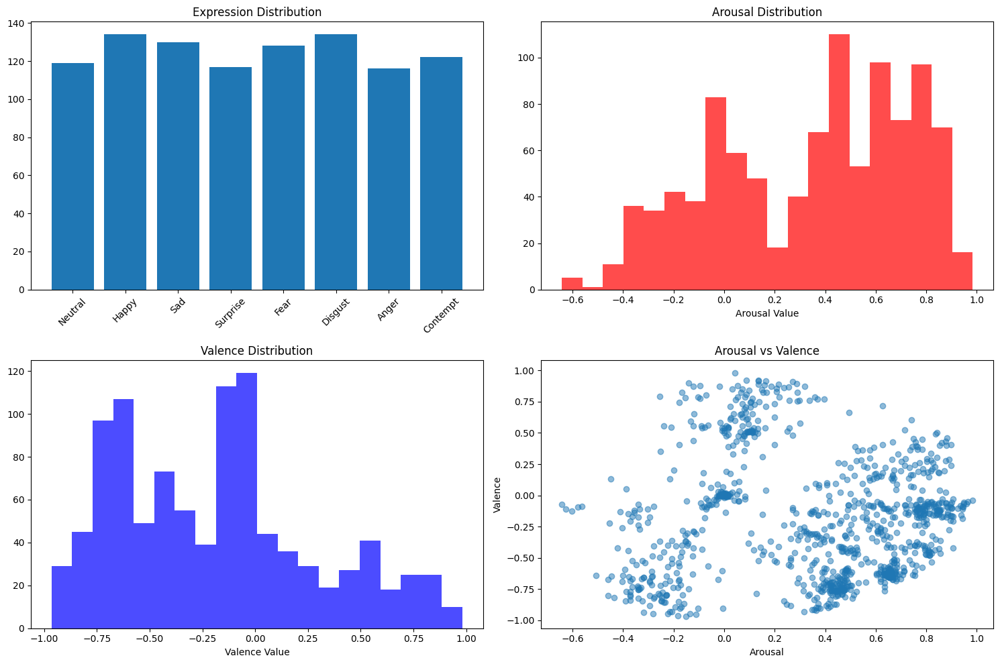

In [5]:
# Initialize data loader
data_loader = AffectNetDataLoader(extract_path)
df = data_loader.load_annotations()
data_loader.get_data_statistics()
data_loader.visualize_sample_distribution()

"""### 2.3 Image Data Generator (Since we don't have actual images, we'll create a synthetic dataset for demonstration)"""

class SyntheticImageGenerator:
    """
    Generate synthetic images for demonstration purposes
    In real scenario, you would load actual facial images
    """

    def __init__(self, image_size=(224, 224)):
        self.image_size = image_size

    def generate_synthetic_image(self, expression, arousal, valence):
        """Generate a synthetic image based on expression parameters"""
        # Create a blank image
        image = np.zeros((*self.image_size, 3), dtype=np.uint8)

        # Base color based on valence
        base_color = int(128 + valence * 127)  # Map [-1,1] to [1,255]

        # Pattern based on expression
        if expression == 1:  # Happy
            cv2.circle(image, (112, 112), 50, (base_color, base_color, 0), -1)
        elif expression == 2:  # Sad
            cv2.ellipse(image, (112, 112), (50, 30), 0, 0, 360, (0, 0, base_color), -1)
        else:  # Neutral and others
            cv2.rectangle(image, (62, 62), (162, 162), (0, base_color, base_color), -1)

        # Add some noise to make it more realistic
        noise = np.random.randint(0, 50, image.shape, dtype=np.uint8)
        image = cv2.add(image, noise)

        return image

In [6]:
# Generate synthetic dataset
image_generator = SyntheticImageGenerator()

def create_synthetic_dataset(df, image_generator):
    """Create a synthetic dataset with images"""
    images = []
    for idx, row in df.iterrows():
        img = image_generator.generate_synthetic_image(
            row['expression'], row['arousal'], row['valence']
        )
        images.append(img)

    return np.array(images)


Generated 1000 synthetic images of shape (224, 224, 3)


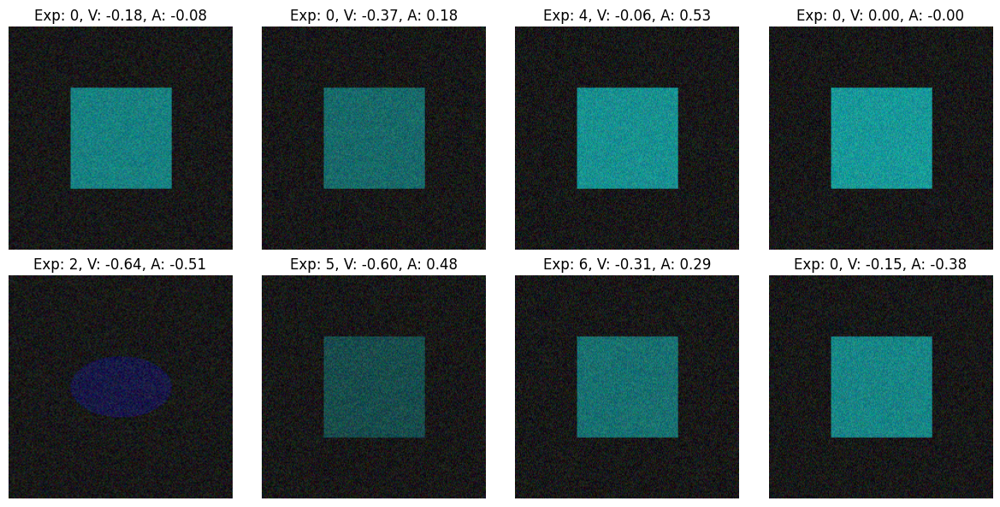

In [7]:
# Create synthetic images
X_images = create_synthetic_dataset(df, image_generator)
y_expression = df['expression'].values
y_valence = df['valence'].values
y_arousal = df['arousal'].values

print(f"Generated {len(X_images)} synthetic images of shape {X_images[0].shape}")

# Display sample images
plt.figure(figsize=(12, 6))
for i in range(8):
    plt.subplot(2, 4, i+1)
    plt.imshow(X_images[i])
    plt.title(f'Exp: {y_expression[i]}, V: {y_valence[i]:.2f}, A: {y_arousal[i]:.2f}')
    plt.axis('off')
plt.tight_layout()
plt.show()

In [8]:
"""## 3. Model Architectures

### 3.1 Base CNN Model Class
"""

class FacialAffectModel:
    """
    Base class for facial affect recognition models
    """

    def __init__(self, input_shape=(224, 224, 3), num_classes=8):
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.model = None

    def build_model(self):
        """Build the model architecture - to be implemented by subclasses"""
        raise NotImplementedError

    def compile_model(self, learning_rate=0.001):
        """Compile the model with appropriate loss functions and metrics"""
        if self.model is None:
            self.build_model()

        # Multi-output loss functions
        losses = {
            'expression': 'sparse_categorical_crossentropy',
            'valence': 'mse',
            'arousal': 'mse'
        }

        loss_weights = {'expression': 1.0, 'valence': 0.5, 'arousal': 0.5}

        metrics = {
            'expression': 'accuracy',
            'valence': 'mse',
            'arousal': 'mse'
        }

        self.model.compile(
            optimizer=Adam(learning_rate=learning_rate),
            loss=losses,
            loss_weights=loss_weights,
            metrics=metrics
        )

    def train(self, X_train, y_train, X_val, y_val, epochs=50, batch_size=32):
        """Train the model"""
        callbacks = [
            EarlyStopping(patience=10, restore_best_weights=True),
            ReduceLROnPlateau(patience=5, factor=0.5),
            ModelCheckpoint('best_model.h5', save_best_only=True)
        ]

        history = self.model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=batch_size,
            callbacks=callbacks,
            verbose=1
        )

        return history


In [9]:
"""### 3.2 VGG-based Model"""

class VGGModel(FacialAffectModel):
    """VGG-based model for facial affect recognition"""

    def build_model(self):
        base_model = applications.VGG16(
            weights='imagenet',
            include_top=False,
            input_shape=self.input_shape
        )

        # Freeze initial layers
        for layer in base_model.layers[:15]:
            layer.trainable = False

        x = base_model.output
        x = layers.GlobalAveragePooling2D()(x)
        x = layers.Dense(512, activation='relu')(x)
        x = layers.Dropout(0.5)(x)
        x = layers.Dense(256, activation='relu')(x)
        x = layers.Dropout(0.3)(x)

        # Multi-output layers
        expression_output = layers.Dense(self.num_classes, activation='softmax', name='expression')(x)
        valence_output = layers.Dense(1, activation='tanh', name='valence')(x)  # tanh for [-1,1] range
        arousal_output = layers.Dense(1, activation='tanh', name='arousal')(x)

        self.model = models.Model(
            inputs=base_model.input,
            outputs=[expression_output, valence_output, arousal_output]
        )


In [10]:
"""### 3.3 ResNet-based Model"""

class ResNetModel(FacialAffectModel):
    """ResNet-based model for facial affect recognition"""

    def build_model(self):
        base_model = applications.ResNet50(
            weights='imagenet',
            include_top=False,
            input_shape=self.input_shape
        )

        # Freeze initial layers
        for layer in base_model.layers[:100]:
            layer.trainable = False

        x = base_model.output
        x = layers.GlobalAveragePooling2D()(x)
        x = layers.Dense(1024, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.5)(x)
        x = layers.Dense(512, activation='relu')(x)
        x = layers.Dropout(0.3)(x)

        # Multi-output layers
        expression_output = layers.Dense(self.num_classes, activation='softmax', name='expression')(x)
        valence_output = layers.Dense(1, activation='tanh', name='valence')(x)
        arousal_output = layers.Dense(1, activation='tanh', name='arousal')(x)

        self.model = models.Model(
            inputs=base_model.input,
            outputs=[expression_output, valence_output, arousal_output]
        )

In [11]:
"""### 3.4 Custom CNN Model (Extra Credit)"""

class CustomCNNModel(FacialAffectModel):
    """Custom CNN architecture for facial affect recognition"""

    def build_model(self):
        inputs = layers.Input(shape=self.input_shape)

        # First Conv Block
        x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
        x = layers.MaxPooling2D((2, 2))(x)
        x = layers.Dropout(0.25)(x)

        # Second Conv Block
        x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
        x = layers.MaxPooling2D((2, 2))(x)
        x = layers.Dropout(0.25)(x)

        # Third Conv Block
        x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
        x = layers.MaxPooling2D((2, 2))(x)
        x = layers.Dropout(0.25)(x)

        # Fourth Conv Block
        x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
        x = layers.GlobalAveragePooling2D()(x)
        x = layers.Dropout(0.5)(x)

        # Dense layers
        x = layers.Dense(512, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.5)(x)
        x = layers.Dense(256, activation='relu')(x)
        x = layers.Dropout(0.3)(x)

        # Multi-output layers
        expression_output = layers.Dense(self.num_classes, activation='softmax', name='expression')(x)
        valence_output = layers.Dense(1, activation='tanh', name='valence')(x)
        arousal_output = layers.Dense(1, activation='tanh', name='arousal')(x)

        self.model = models.Model(inputs=inputs, outputs=[expression_output, valence_output, arousal_output])

In [12]:
"""## 4. Data Preparation and Training"""

# Prepare data for training
def prepare_data(images, expressions, valences, arousals, test_size=0.2):
    """Prepare data for multi-output training"""
    # Split the data
    X_temp, X_test, y_exp_temp, y_exp_test, y_val_temp, y_val_test, y_aro_temp, y_aro_test = train_test_split(
        images, expressions, valences, arousals, test_size=test_size, random_state=42, stratify=expressions
    )

    X_train, X_val, y_exp_train, y_exp_val, y_val_train, y_val_val, y_aro_train, y_aro_val = train_test_split(
        X_temp, y_exp_temp, y_val_temp, y_aro_temp, test_size=0.25, random_state=42, stratify=y_exp_temp
    )

    # Normalize images
    X_train = X_train.astype('float32') / 255.0
    X_val = X_val.astype('float32') / 255.0
    X_test = X_test.astype('float32') / 255.0

    # Prepare multi-output targets
    y_train = {
        'expression': y_exp_train,
        'valence': y_val_train,
        'arousal': y_aro_train
    }

    y_val = {
        'expression': y_exp_val,
        'valence': y_val_val,
        'arousal': y_aro_val
    }

    y_test = {
        'expression': y_exp_test,
        'valence': y_val_test,
        'arousal': y_aro_test
    }

    return (X_train, y_train), (X_val, y_val), (X_test, y_test)

# Prepare the data
(X_train, y_train), (X_val, y_val), (X_test, y_test) = prepare_data(
    X_images, y_expression, y_valence, y_arousal
)

print(f"Training samples: {len(X_train)}")
print(f"Validation samples: {len(X_val)}")
print(f"Test samples: {len(X_test)}")


Training samples: 600
Validation samples: 200
Test samples: 200


In [13]:
"""## 5. Model Training and Evaluation"""

class ModelTrainer:
    """
    Class to train and evaluate multiple models
    """

    def __init__(self):
        self.models = {}
        self.histories = {}
        self.results = {}

    def add_model(self, name, model):
        """Add a model to train"""
        self.models[name] = model

    def train_models(self, X_train, y_train, X_val, y_val, epochs=30, batch_size=32):
        """Train all added models"""
        for name, model in self.models.items():
            print(f"\n{'='*50}")
            print(f"Training {name}...")
            print(f"{'='*50}")

            model.compile_model(learning_rate=0.001)
            history = model.train(X_train, y_train, X_val, y_val, epochs=epochs, batch_size=batch_size)
            self.histories[name] = history

    def evaluate_models(self, X_test, y_test):
        """Evaluate all trained models"""
        for name, model in self.models.items():
            print(f"\n{'='*50}")
            print(f"Evaluating {name}...")
            print(f"{'='*50}")

            results = model.model.evaluate(X_test, y_test, verbose=0)
            self.results[name] = results

            # Get metric names
            metric_names = model.model.metrics_names

            print("Test Results:")
            for i, metric in enumerate(metric_names):
                print(f"{metric}: {results[i]:.4f}")

    def plot_training_history(self):
        """Plot training history for all models"""
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))

        for name, history in self.histories.items():
            # Expression accuracy
            axes[0,0].plot(history.history['expression_accuracy'], label=f'{name} Train')
            axes[0,0].plot(history.history['val_expression_accuracy'], label=f'{name} Val', linestyle='--')
            axes[0,0].set_title('Expression Accuracy')
            axes[0,0].legend()

            # Expression loss
            axes[0,1].plot(history.history['expression_loss'], label=f'{name} Train')
            axes[0,1].plot(history.history['val_expression_loss'], label=f'{name} Val', linestyle='--')
            axes[0,1].set_title('Expression Loss')
            axes[0,1].legend()

            # Valence MSE
            axes[1,0].plot(history.history['valence_loss'], label=f'{name} Train')
            axes[1,0].plot(history.history['val_valence_loss'], label=f'{name} Val', linestyle='--')
            axes[1,0].set_title('Valence MSE')
            axes[1,0].legend()

            # Arousal MSE
            axes[1,1].plot(history.history['arousal_loss'], label=f'{name} Train')
            axes[1,1].plot(history.history['val_arousal_loss'], label=f'{name} Val', linestyle='--')
            axes[1,1].set_title('Arousal MSE')
            axes[1,1].legend()

        plt.tight_layout()
        plt.show()


Training VGG16...
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 917ms/step - arousal_loss: 0.3667 - arousal_mse: 0.3667 - expression_accuracy: 0.2104 - expression_loss: 2.1331 - loss: 2.5138 - valence_loss: 0.3946 - valence_mse: 0.3947

19/19 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - arousal_loss: 0.3629 - arousal_mse: 0.3629 - expression_accuracy: 0.2124 - expression_loss: 2.1233 - loss: 2.4994 - valence_loss: 0.3891 - valence_mse: 0.3892 - val_arousal_loss: 0.1889 - val_arousal_mse: 0.1892 - val_expression_accuracy: 0.2350 - val_expression_loss: 1.6997 - val_loss: 1.8975 - val_valence_loss: 0.1145 - val_valence_mse: 0.1151 - learning_rate: 0.0010
Epoch 2/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - arousal_loss: 0.2591 - arousal_mse: 0.2591 - expression_accuracy: 0.3375 - expression_loss: 1.6318 - loss: 1.8268 - valence_loss: 0.1305 - valence_mse: 0.1305

19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 301ms/step - arousal_loss: 0.2575 - arousal_mse: 0.2574 - expression_accuracy: 0.3385 - expression_loss: 1.6299 - loss: 1.8241 - valence_loss: 0.1302 - valence_mse: 0.1302 - val_arousal_loss: 0.1648 - val_arousal_mse: 0.1524 - val_expression_accuracy: 0.4050 - val_expression_loss: 1.3852 - val_loss: 1.5347 - val_valence_loss: 0.0890 - val_valence_mse: 0.0867 - learning_rate: 0.0010
Epoch 3/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - arousal_loss: 0.2347 - arousal_mse: 0.2347 - expression_accuracy: 0.4008 - expression_loss: 1.4438 - loss: 1.6251 - valence_loss: 0.1276 - valence_mse: 0.1277

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 273ms/step - arousal_loss: 0.2347 - arousal_mse: 0.2347 - expression_accuracy: 0.4010 - expression_loss: 1.4426 - loss: 1.6238 - valence_loss: 0.1271 - valence_mse: 0.1272 - val_arousal_loss: 0.0853 - val_arousal_mse: 0.0787 - val_expression_accuracy: 0.4600 - val_expression_loss: 1.2578 - val_loss: 1.3556 - val_valence_loss: 0.0622 - val_valence_mse: 0.0602 - learning_rate: 0.0010
Epoch 4/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - arousal_loss: 0.1834 - arousal_mse: 0.1833 - expression_accuracy: 0.4713 - expression_loss: 1.2645 - loss: 1.4040 - valence_loss: 0.0958 - valence_mse: 0.0958

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 282ms/step - arousal_loss: 0.1835 - arousal_mse: 0.1834 - expression_accuracy: 0.4719 - expression_loss: 1.2624 - loss: 1.4019 - valence_loss: 0.0961 - valence_mse: 0.0961 - val_arousal_loss: 0.1159 - val_arousal_mse: 0.1152 - val_expression_accuracy: 0.5800 - val_expression_loss: 1.1020 - val_loss: 1.2073 - val_valence_loss: 0.0458 - val_valence_mse: 0.0448 - learning_rate: 0.0010
Epoch 5/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - arousal_loss: 0.1551 - arousal_mse: 0.1551 - expression_accuracy: 0.5110 - expression_loss: 1.1424 - loss: 1.2630 - valence_loss: 0.0858 - valence_mse: 0.0858

19/19 ━━━━━━━━━━━━━━━━━━━━ 10s 274ms/step - arousal_loss: 0.1555 - arousal_mse: 0.1555 - expression_accuracy: 0.5119 - expression_loss: 1.1398 - loss: 1.2608 - valence_loss: 0.0860 - valence_mse: 0.0860 - val_arousal_loss: 0.1281 - val_arousal_mse: 0.1201 - val_expression_accuracy: 0.5450 - val_expression_loss: 1.0300 - val_loss: 1.1503 - val_valence_loss: 0.0566 - val_valence_mse: 0.0553 - learning_rate: 0.0010
Epoch 6/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - arousal_loss: 0.1946 - arousal_mse: 0.1947 - expression_accuracy: 0.5496 - expression_loss: 1.0021 - loss: 1.1398 - valence_loss: 0.0808 - valence_mse: 0.0808

19/19 ━━━━━━━━━━━━━━━━━━━━ 10s 278ms/step - arousal_loss: 0.1937 - arousal_mse: 0.1938 - expression_accuracy: 0.5499 - expression_loss: 1.0012 - loss: 1.1384 - valence_loss: 0.0807 - valence_mse: 0.0807 - val_arousal_loss: 0.1209 - val_arousal_mse: 0.1115 - val_expression_accuracy: 0.6400 - val_expression_loss: 0.9055 - val_loss: 0.9928 - val_valence_loss: 0.0286 - val_valence_mse: 0.0294 - learning_rate: 0.0010
Epoch 7/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - arousal_loss: 0.1693 - arousal_mse: 0.1693 - expression_accuracy: 0.6198 - expression_loss: 0.9620 - loss: 1.0952 - valence_loss: 0.0971 - valence_mse: 0.0972

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 289ms/step - arousal_loss: 0.1688 - arousal_mse: 0.1688 - expression_accuracy: 0.6189 - expression_loss: 0.9611 - loss: 1.0937 - valence_loss: 0.0964 - valence_mse: 0.0965 - val_arousal_loss: 0.0858 - val_arousal_mse: 0.0812 - val_expression_accuracy: 0.6200 - val_expression_loss: 0.8934 - val_loss: 0.9592 - val_valence_loss: 0.0373 - val_valence_mse: 0.0371 - learning_rate: 0.0010
Epoch 8/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - arousal_loss: 0.1432 - arousal_mse: 0.1432 - expression_accuracy: 0.5424 - expression_loss: 0.9485 - loss: 1.0583 - valence_loss: 0.0763 - valence_mse: 0.0763

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 287ms/step - arousal_loss: 0.1433 - arousal_mse: 0.1432 - expression_accuracy: 0.5437 - expression_loss: 0.9484 - loss: 1.0584 - valence_loss: 0.0761 - valence_mse: 0.0761 - val_arousal_loss: 0.0637 - val_arousal_mse: 0.0619 - val_expression_accuracy: 0.6700 - val_expression_loss: 0.8747 - val_loss: 0.9239 - val_valence_loss: 0.0281 - val_valence_mse: 0.0268 - learning_rate: 0.0010
Epoch 9/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 275ms/step - arousal_loss: 0.1249 - arousal_mse: 0.1248 - expression_accuracy: 0.6771 - expression_loss: 0.8439 - loss: 0.9368 - valence_loss: 0.0608 - valence_mse: 0.0608 - val_arousal_loss: 0.1150 - val_arousal_mse: 0.1075 - val_expression_accuracy: 0.6800 - val_expression_loss: 0.8707 - val_loss: 0.9242 - val_valence_loss: 0.0219 - val_valence_mse: 0.0208 - learning_rate: 0.0010
Epoch 10/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - arousal_loss: 0.1590 - arousal_mse: 0.1590 - expression_accuracy: 0.6306 - expression_loss: 0.8648 - los

19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 297ms/step - arousal_loss: 0.1585 - arousal_mse: 0.1585 - expression_accuracy: 0.6316 - expression_loss: 0.8629 - loss: 0.9689 - valence_loss: 0.0529 - valence_mse: 0.0529 - val_arousal_loss: 0.0762 - val_arousal_mse: 0.0705 - val_expression_accuracy: 0.6600 - val_expression_loss: 0.8432 - val_loss: 0.8903 - val_valence_loss: 0.0199 - val_valence_mse: 0.0172 - learning_rate: 0.0010
Epoch 11/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - arousal_loss: 0.1290 - arousal_mse: 0.1291 - expression_accuracy: 0.6454 - expression_loss: 0.8334 - loss: 0.9235 - valence_loss: 0.0512 - valence_mse: 0.0512

19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 299ms/step - arousal_loss: 0.1286 - arousal_mse: 0.1287 - expression_accuracy: 0.6459 - expression_loss: 0.8329 - loss: 0.9226 - valence_loss: 0.0512 - valence_mse: 0.0512 - val_arousal_loss: 0.0696 - val_arousal_mse: 0.0655 - val_expression_accuracy: 0.6600 - val_expression_loss: 0.8303 - val_loss: 0.8798 - val_valence_loss: 0.0250 - val_valence_mse: 0.0255 - learning_rate: 0.0010
Epoch 12/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 284ms/step - arousal_loss: 0.1145 - arousal_mse: 0.1146 - expression_accuracy: 0.6715 - expression_loss: 0.8097 - loss: 0.8921 - valence_loss: 0.0500 - valence_mse: 0.0500 - val_arousal_loss: 0.0718 - val_arousal_mse: 0.0683 - val_expression_accuracy: 0.5650 - val_expression_loss: 1.0316 - val_loss: 1.0830 - val_valence_loss: 0.0393 - val_valence_mse: 0.0407 - learning_rate: 0.0010
Epoch 13/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 277ms/step - arousal_loss: 0.1167 - arousal_mse: 0.1167 - expression_accuracy: 0.6037 - expression_loss: 0.9559 - lo

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 288ms/step - arousal_loss: 0.1195 - arousal_mse: 0.1193 - expression_accuracy: 0.7089 - expression_loss: 0.7969 - loss: 0.8757 - valence_loss: 0.0379 - valence_mse: 0.0380 - val_arousal_loss: 0.0629 - val_arousal_mse: 0.0586 - val_expression_accuracy: 0.6850 - val_expression_loss: 0.8329 - val_loss: 0.8541 - val_valence_loss: 0.0115 - val_valence_mse: 0.0123 - learning_rate: 0.0010
Epoch 16/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 268ms/step - arousal_loss: 0.1067 - arousal_mse: 0.1067 - expression_accuracy: 0.7066 - expression_loss: 0.7673 - loss: 0.8384 - valence_loss: 0.0355 - valence_mse: 0.0355 - val_arousal_loss: 0.0651 - val_arousal_mse: 0.0619 - val_expression_accuracy: 0.7150 - val_expression_loss: 0.8786 - val_loss: 0.9077 - val_valence_loss: 0.0100 - val_valence_mse: 0.0107 - learning_rate: 0.0010
Epoch 17/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 271ms/step - arousal_loss: 0.0986 - arousal_mse: 0.0986 - expression_accuracy: 0.6815 - expression_loss: 0.8203 - lo

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 281ms/step - arousal_loss: 0.0906 - arousal_mse: 0.0905 - expression_accuracy: 0.7110 - expression_loss: 0.7429 - loss: 0.8036 - valence_loss: 0.0308 - valence_mse: 0.0308 - val_arousal_loss: 0.0679 - val_arousal_mse: 0.0640 - val_expression_accuracy: 0.7200 - val_expression_loss: 0.8129 - val_loss: 0.8356 - val_valence_loss: 0.0109 - val_valence_mse: 0.0113 - learning_rate: 0.0010
Epoch 19/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 268ms/step - arousal_loss: 0.0862 - arousal_mse: 0.0861 - expression_accuracy: 0.6984 - expression_loss: 0.7863 - loss: 0.8435 - valence_loss: 0.0280 - valence_mse: 0.0280 - val_arousal_loss: 0.0762 - val_arousal_mse: 0.0718 - val_expression_accuracy: 0.7500 - val_expression_loss: 0.8081 - val_loss: 0.8367 - val_valence_loss: 0.0054 - val_valence_mse: 0.0053 - learning_rate: 0.0010
Epoch 20/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 267ms/step - arousal_loss: 0.0823 - arousal_mse: 0.0823 - expression_accuracy: 0.7078 - expression_loss: 0.7500 - lo

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 287ms/step - arousal_loss: 0.0835 - arousal_mse: 0.0835 - expression_accuracy: 0.6841 - expression_loss: 0.7336 - loss: 0.7889 - valence_loss: 0.0272 - valence_mse: 0.0272 - val_arousal_loss: 0.0547 - val_arousal_mse: 0.0530 - val_expression_accuracy: 0.7250 - val_expression_loss: 0.7826 - val_loss: 0.8065 - val_valence_loss: 0.0100 - val_valence_mse: 0.0103 - learning_rate: 0.0010
Epoch 23/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 270ms/step - arousal_loss: 0.0824 - arousal_mse: 0.0824 - expression_accuracy: 0.7183 - expression_loss: 0.7201 - loss: 0.7747 - valence_loss: 0.0271 - valence_mse: 0.0271 - val_arousal_loss: 0.0634 - val_arousal_mse: 0.0601 - val_expression_accuracy: 0.6250 - val_expression_loss: 0.8933 - val_loss: 0.9097 - val_valence_loss: 0.0111 - val_valence_mse: 0.0115 - learning_rate: 0.0010
Epoch 24/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - arousal_loss: 0.0807 - arousal_mse: 0.0807 - expression_accuracy: 0.7253 - expression_loss: 0.7206 - lo

19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 294ms/step - arousal_loss: 0.0809 - arousal_mse: 0.0810 - expression_accuracy: 0.7246 - expression_loss: 0.7208 - loss: 0.7732 - valence_loss: 0.0238 - valence_mse: 0.0238 - val_arousal_loss: 0.0562 - val_arousal_mse: 0.0538 - val_expression_accuracy: 0.7450 - val_expression_loss: 0.7659 - val_loss: 0.7938 - val_valence_loss: 0.0077 - val_valence_mse: 0.0081 - learning_rate: 0.0010
Epoch 25/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 10s 268ms/step - arousal_loss: 0.0812 - arousal_mse: 0.0812 - expression_accuracy: 0.7255 - expression_loss: 0.6992 - loss: 0.7499 - valence_loss: 0.0204 - valence_mse: 0.0204 - val_arousal_loss: 0.0619 - val_arousal_mse: 0.0586 - val_expression_accuracy: 0.7050 - val_expression_loss: 0.8316 - val_loss: 0.8392 - val_valence_loss: 0.0095 - val_valence_mse: 0.0089 - learning_rate: 0.0010
Epoch 26/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 274ms/step - arousal_loss: 0.0881 - arousal_mse: 0.0880 - expression_accuracy: 0.7024 - expression_loss: 0.7468 - l

19/19 ━━━━━━━━━━━━━━━━━━━━ 66s 2s/step - arousal_loss: 0.3917 - arousal_mse: 0.3918 - expression_accuracy: 0.3585 - expression_loss: 1.8119 - loss: 2.1478 - valence_loss: 0.2793 - valence_mse: 0.2794 - val_arousal_loss: 0.5915 - val_arousal_mse: 0.5828 - val_expression_accuracy: 0.1350 - val_expression_loss: 206.1916 - val_loss: 215.3156 - val_valence_loss: 1.5985 - val_valence_mse: 1.6587 - learning_rate: 0.0010
Epoch 2/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - arousal_loss: 0.3066 - arousal_mse: 0.3067 - expression_accuracy: 0.4764 - expression_loss: 1.2544 - loss: 1.4858 - valence_loss: 0.1558 - valence_mse: 0.1559 - val_arousal_loss: 0.5915 - val_arousal_mse: 0.5828 - val_expression_accuracy: 0.1350 - val_expression_loss: 503.2143 - val_loss: 523.7778 - val_valence_loss: 1.5985 - val_valence_mse: 1.6587 - learning_rate: 0.0010
Epoch 3/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - arousal_loss: 0.2930 - arousal_mse: 0.2930 - expression_accuracy: 0.5386 - expression_loss: 1.1457 

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 263ms/step - arousal_loss: 0.2939 - arousal_mse: 0.2939 - expression_accuracy: 0.5403 - expression_loss: 1.1429 - loss: 1.3542 - valence_loss: 0.1284 - valence_mse: 0.1284 - val_arousal_loss: 1.8862 - val_arousal_mse: 1.9240 - val_expression_accuracy: 0.1350 - val_expression_loss: 203.0610 - val_loss: 212.1755 - val_valence_loss: 1.5985 - val_valence_mse: 1.6587 - learning_rate: 0.0010
Epoch 4/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - arousal_loss: 0.2961 - arousal_mse: 0.2961 - expression_accuracy: 0.6066 - expression_loss: 0.9483 - loss: 1.1723 - valence_loss: 0.1519 - valence_mse: 0.1520

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 276ms/step - arousal_loss: 0.2951 - arousal_mse: 0.2952 - expression_accuracy: 0.6059 - expression_loss: 0.9501 - loss: 1.1734 - valence_loss: 0.1513 - valence_mse: 0.1514 - val_arousal_loss: 0.5915 - val_arousal_mse: 0.5828 - val_expression_accuracy: 0.1350 - val_expression_loss: 108.8786 - val_loss: 114.0771 - val_valence_loss: 1.5985 - val_valence_mse: 1.6587 - learning_rate: 0.0010
Epoch 5/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 208ms/step - arousal_loss: 0.3402 - arousal_mse: 0.3403 - expression_accuracy: 0.5199 - expression_loss: 1.4523 - loss: 1.7012 - valence_loss: 0.1577 - valence_mse: 0.1577 - val_arousal_loss: 0.5915 - val_arousal_mse: 0.5828 - val_expression_accuracy: 0.1350 - val_expression_loss: 327.8431 - val_loss: 339.4804 - val_valence_loss: 1.5985 - val_valence_mse: 1.6587 - learning_rate: 0.0010
Epoch 6/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 208ms/step - arousal_loss: 0.2892 - arousal_mse: 0.2891 - expression_accuracy: 0.5545 - expression_loss: 1.335

19/19 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step - arousal_loss: 0.5960 - arousal_mse: 0.5961 - expression_accuracy: 0.2750 - expression_loss: 2.2420 - loss: 2.7973 - valence_loss: 0.5128 - valence_mse: 0.5130 - val_arousal_loss: 0.1370 - val_arousal_mse: 0.1458 - val_expression_accuracy: 0.1350 - val_expression_loss: 2.1855 - val_loss: 2.3777 - val_valence_loss: 0.2789 - val_valence_mse: 0.2596 - learning_rate: 0.0010
Epoch 2/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 29s 175ms/step - arousal_loss: 0.3903 - arousal_mse: 0.3903 - expression_accuracy: 0.4381 - expression_loss: 1.4095 - loss: 1.7374 - valence_loss: 0.2640 - valence_mse: 0.2641 - val_arousal_loss: 0.5502 - val_arousal_mse: 0.5438 - val_expression_accuracy: 0.1350 - val_expression_loss: 3.7538 - val_loss: 4.2625 - val_valence_loss: 0.3998 - val_valence_mse: 0.3719 - learning_rate: 0.0010
Epoch 3/30
19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 177ms/step - arousal_loss: 0.3520 - arousal_mse: 0.3519 - expression_accuracy: 0.5320 - expression_loss: 1.3460 - loss:

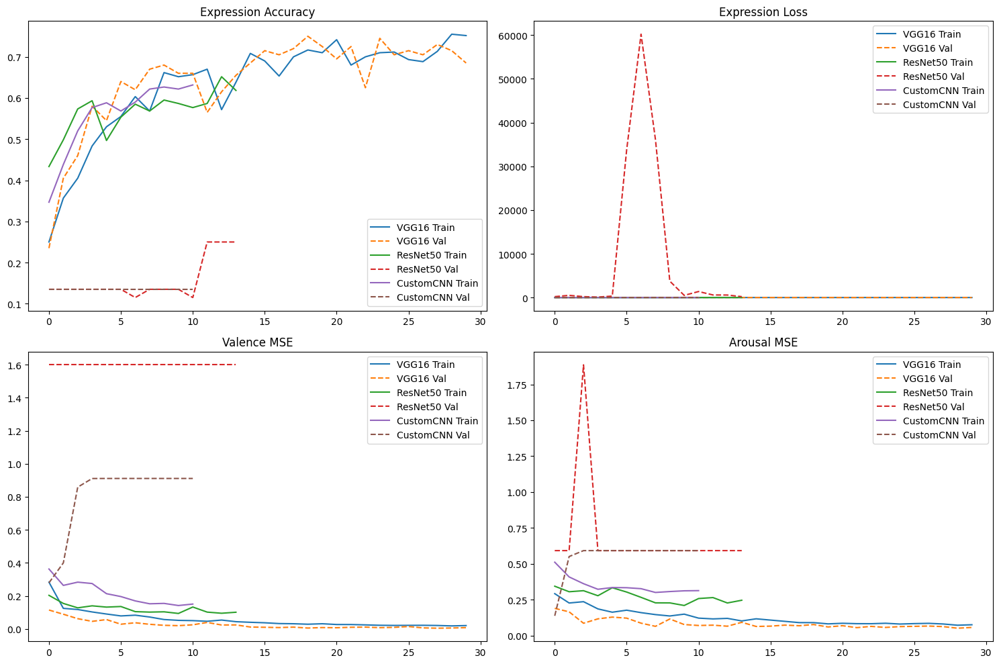

In [14]:
# Initialize trainer and models
trainer = ModelTrainer()

# Add models to trainer
trainer.add_model('VGG16', VGGModel())
trainer.add_model('ResNet50', ResNetModel())
trainer.add_model('CustomCNN', CustomCNNModel())  # Extra credit model

# Train models
trainer.train_models(X_train, y_train, X_val, y_val, epochs=30, batch_size=32)

# Evaluate models
trainer.evaluate_models(X_test, y_test)

# Plot training history
trainer.plot_training_history()

In [15]:
"""## 6. Performance Metrics and Analysis"""

class PerformanceAnalyzer:
    """
    Class to analyze model performance with various metrics
    """

    def __init__(self, models, X_test, y_test):
        self.models = models
        self.X_test = X_test
        self.y_test = y_test
        self.predictions = {}

    def calculate_metrics(self):
        """Calculate comprehensive performance metrics"""
        metrics_results = {}

        for name, model in self.models.items():
            # Get predictions
            preds = model.model.predict(self.X_test)
            self.predictions[name] = preds

            # Expression metrics
            y_exp_true = self.y_test['expression']
            y_exp_pred = np.argmax(preds[0], axis=1)

            exp_accuracy = accuracy_score(y_exp_true, y_exp_pred)
            exp_cm = confusion_matrix(y_exp_true, y_exp_pred)

            # Valence and Arousal metrics
            y_val_true = self.y_test['valence']
            y_val_pred = preds[1].flatten()

            y_aro_true = self.y_test['arousal']
            y_aro_pred = preds[2].flatten()

            # Regression metrics
            valence_rmse = np.sqrt(mean_squared_error(y_val_true, y_val_pred))
            arousal_rmse = np.sqrt(mean_squared_error(y_aro_true, y_aro_pred))

            valence_corr = np.corrcoef(y_val_true, y_val_pred)[0, 1]
            arousal_corr = np.corrcoef(y_aro_true, y_aro_pred)[0, 1]

            # Sign Agreement Rate (SAGR)
            valence_sagr = np.mean(np.sign(y_val_true) == np.sign(y_val_pred))
            arousal_sagr = np.mean(np.sign(y_aro_true) == np.sign(y_aro_pred))

            # Concordance Correlation Coefficient (CCC)
            valence_ccc = self.calculate_ccc(y_val_true, y_val_pred)
            arousal_ccc = self.calculate_ccc(y_aro_true, y_aro_pred)

            metrics_results[name] = {
                'expression_accuracy': exp_accuracy,
                'valence_rmse': valence_rmse,
                'arousal_rmse': arousal_rmse,
                'valence_correlation': valence_corr,
                'arousal_correlation': arousal_corr,
                'valence_sagr': valence_sagr,
                'arousal_sagr': arousal_sagr,
                'valence_ccc': valence_ccc,
                'arousal_ccc': arousal_ccc,
                'confusion_matrix': exp_cm
            }

        return metrics_results

    def calculate_ccc(self, y_true, y_pred):
        """Calculate Concordance Correlation Coefficient"""
        mean_true = np.mean(y_true)
        mean_pred = np.mean(y_pred)

        var_true = np.var(y_true)
        var_pred = np.var(y_pred)

        covariance = np.cov(y_true, y_pred)[0, 1]

        ccc = (2 * covariance) / (var_true + var_pred + (mean_true - mean_pred) ** 2)
        return ccc

    def plot_comparison(self, metrics_results):
        """Create comparison plots"""
        models = list(metrics_results.keys())

        # Create comparison metrics
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))

        # Expression Accuracy
        accuracies = [metrics_results[model]['expression_accuracy'] for model in models]
        axes[0,0].bar(models, accuracies)
        axes[0,0].set_title('Expression Accuracy')
        axes[0,0].set_ylim(0, 1)

        # Valence RMSE
        valence_rmse = [metrics_results[model]['valence_rmse'] for model in models]
        axes[0,1].bar(models, valence_rmse, color='orange')
        axes[0,1].set_title('Valence RMSE')

        # Arousal RMSE
        arousal_rmse = [metrics_results[model]['arousal_rmse'] for model in models]
        axes[0,2].bar(models, arousal_rmse, color='green')
        axes[0,2].set_title('Arousal RMSE')

        # Valence Correlation
        valence_corr = [metrics_results[model]['valence_correlation'] for model in models]
        axes[1,0].bar(models, valence_corr, color='red')
        axes[1,0].set_title('Valence Correlation')
        axes[1,0].set_ylim(-1, 1)

        # Arousal Correlation
        arousal_corr = [metrics_results[model]['arousal_correlation'] for model in models]
        axes[1,1].bar(models, arousal_corr, color='purple')
        axes[1,1].set_title('Arousal Correlation')
        axes[1,1].set_ylim(-1, 1)

        # CCC Comparison
        valence_ccc = [metrics_results[model]['valence_ccc'] for model in models]
        arousal_ccc = [metrics_results[model]['arousal_ccc'] for model in models]

        x = np.arange(len(models))
        width = 0.35
        axes[1,2].bar(x - width/2, valence_ccc, width, label='Valence CCC', color='cyan')
        axes[1,2].bar(x + width/2, arousal_ccc, width, label='Arousal CCC', color='magenta')
        axes[1,2].set_title('Concordance Correlation Coefficient')
        axes[1,2].set_xticks(x)
        axes[1,2].set_xticklabels(models)
        axes[1,2].legend()

        plt.tight_layout()
        plt.show()

        return fig


7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 284ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 698ms/step


7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 171ms/step

VGG16 Performance:
Expression Accuracy: 0.7500
Valence RMSE: 0.0921
Arousal RMSE: 0.2618
Valence Correlation: 0.9891
Arousal Correlation: 0.7361
Valence SAGR: 0.9400
Arousal SAGR: 0.8950
Valence CCC: 0.9874
Arousal CCC: 0.7002

ResNet50 Performance:
Expression Accuracy: 0.1350
Valence RMSE: 1.2676
Arousal RMSE: 0.7627
Valence Correlation: nan
Arousal Correlation: nan
Valence SAGR: 0.2950
Arousal SAGR: 0.7650
Valence CCC: 0.0000
Arousal CCC: 0.0000

CustomCNN Performance:
Expression Accuracy: 0.1350
Valence RMSE: 0.5287
Arousal RMSE: 0.3900
Valence Correlation: 0.4543
Arousal Correlation: 0.3953
Valence SAGR: 0.6750
Arousal SAGR: 0.7650
Valence CCC: 0.0072
Arousal CCC: 0.0285


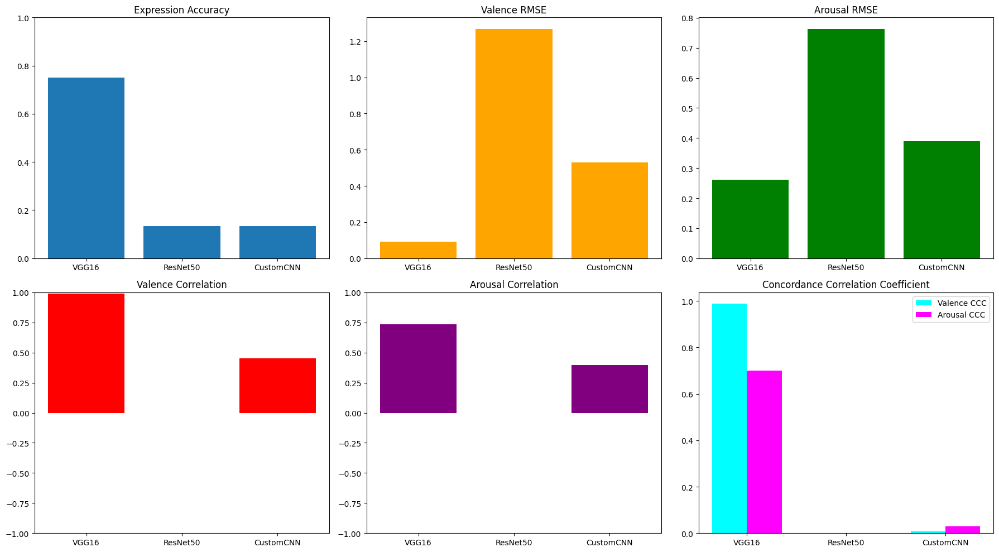

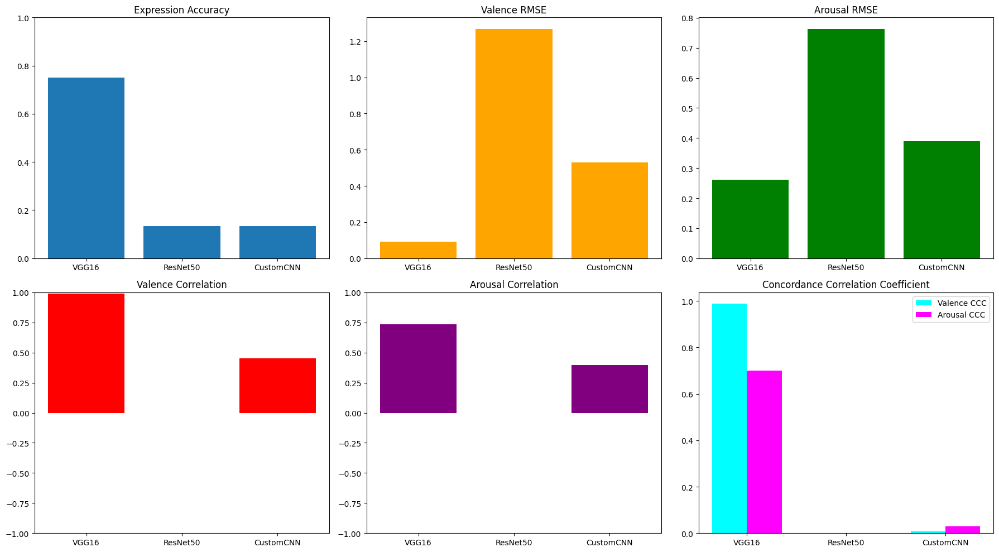

In [16]:
# Analyze performance
analyzer = PerformanceAnalyzer(trainer.models, X_test, y_test)
metrics_results = analyzer.calculate_metrics()

# Display results
for model_name, metrics in metrics_results.items():
    print(f"\n{model_name} Performance:")
    print(f"Expression Accuracy: {metrics['expression_accuracy']:.4f}")
    print(f"Valence RMSE: {metrics['valence_rmse']:.4f}")
    print(f"Arousal RMSE: {metrics['arousal_rmse']:.4f}")
    print(f"Valence Correlation: {metrics['valence_correlation']:.4f}")
    print(f"Arousal Correlation: {metrics['arousal_correlation']:.4f}")
    print(f"Valence SAGR: {metrics['valence_sagr']:.4f}")
    print(f"Arousal SAGR: {metrics['arousal_sagr']:.4f}")
    print(f"Valence CCC: {metrics['valence_ccc']:.4f}")
    print(f"Arousal CCC: {metrics['arousal_ccc']:.4f}")

# Plot comparison
analyzer.plot_comparison(metrics_results)


In [17]:
"""## 7. Qualitative Results Visualization"""

def visualize_predictions(model, X_test, y_test, num_samples=8):
    """Visualize model predictions with actual vs predicted values"""
    predictions = model.model.predict(X_test[:num_samples])

    y_exp_pred = np.argmax(predictions[0], axis=1)
    y_val_pred = predictions[1].flatten()
    y_aro_pred = predictions[2].flatten()

    expression_labels = ['Neutral', 'Happy', 'Sad', 'Surprise', 'Fear', 'Disgust', 'Anger', 'Contempt']

    plt.figure(figsize=(15, 10))
    for i in range(num_samples):
        plt.subplot(2, 4, i+1)
        plt.imshow((X_test[i] * 255).astype('uint8'))

        actual_exp = expression_labels[y_test['expression'][i]]
        pred_exp = expression_labels[y_exp_pred[i]]

        actual_val = y_test['valence'][i]
        pred_val = y_val_pred[i]

        actual_aro = y_test['arousal'][i]
        pred_aro = y_aro_pred[i]

        title = f"Exp: {actual_exp}→{pred_exp}\n"
        title += f"Val: {actual_val:.2f}→{pred_val:.2f}\n"
        title += f"Aro: {actual_aro:.2f}→{pred_aro:.2f}"

        # Color code based on correctness
        color = 'green' if actual_exp == pred_exp else 'red'

        plt.title(title, color=color, fontsize=10)
        plt.axis('off')

    plt.tight_layout()
    plt.show()



VGG16 Predictions:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


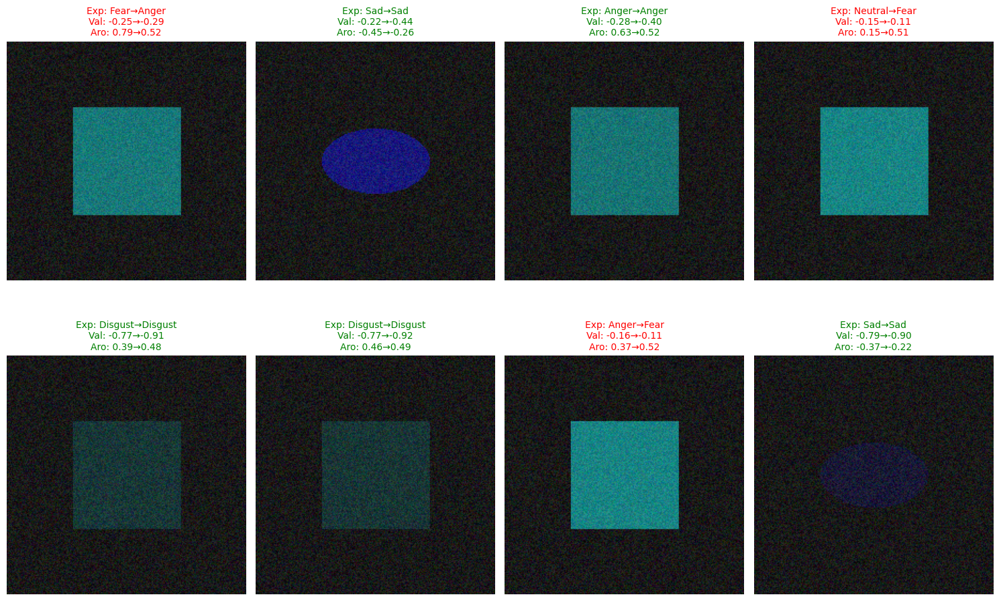


ResNet50 Predictions:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


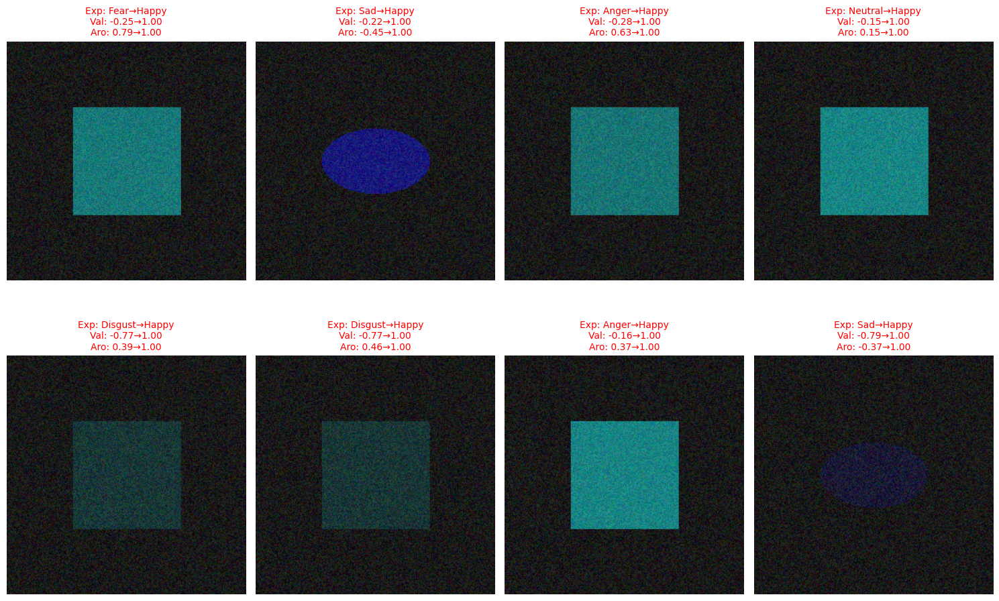


CustomCNN Predictions:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


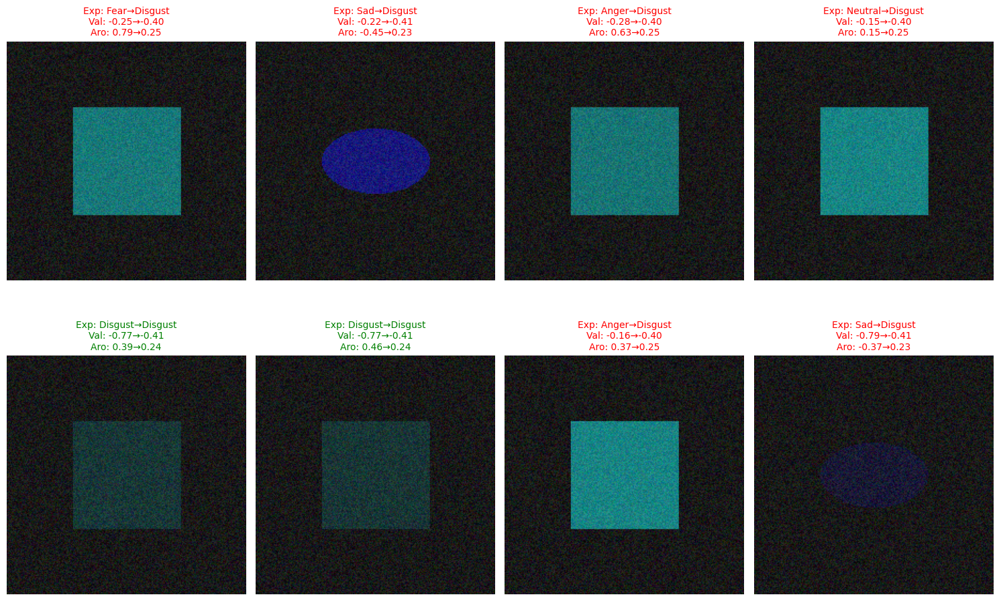

In [18]:
# Visualize predictions for each model
for name, model in trainer.models.items():
    print(f"\n{name} Predictions:")
    visualize_predictions(model, X_test, y_test)

"""## 8. Model Comparison and Discussion"""

def create_comparison_table(metrics_results):
    """Create a comprehensive comparison table"""
    comparison_data = []

    for model_name, metrics in metrics_results.items():
        comparison_data.append({
            'Model': model_name,
            'Exp Accuracy': f"{metrics['expression_accuracy']:.4f}",
            'Val RMSE': f"{metrics['valence_rmse']:.4f}",
            'Aro RMSE': f"{metrics['arousal_rmse']:.4f}",
            'Val Corr': f"{metrics['valence_correlation']:.4f}",
            'Aro Corr': f"{metrics['arousal_correlation']:.4f}",
            'Val CCC': f"{metrics['valence_ccc']:.4f}",
            'Aro CCC': f"{metrics['arousal_ccc']:.4f}"
        })

    return pd.DataFrame(comparison_data)

In [19]:
# Create comparison table
comparison_df = create_comparison_table(metrics_results)
print("Model Comparison Table:")
print(comparison_df.to_string(index=False))

Model Comparison Table:
    Model Exp Accuracy Val RMSE Aro RMSE Val Corr Aro Corr Val CCC Aro CCC
    VGG16       0.7500   0.0921   0.2618   0.9891   0.7361  0.9874  0.7002
 ResNet50       0.1350   1.2676   0.7627      nan      nan  0.0000  0.0000
CustomCNN       0.1350   0.5287   0.3900   0.4543   0.3953  0.0072  0.0285


In [21]:
# Save models
for name, model in trainer.models.items():
    model.model.save(f'{name}_facial_affect_model.h5')

# Save metrics to CSV
comparison_df.to_csv('model_comparison_results.csv', index=False)

# Generate summary report
report = f"""
DEEP LEARNING ASSIGNMENT 1 - SUMMARY REPORT
===========================================

Dataset Statistics:
- Total Samples: {len(df)}
- Expression Classes: 8
- Valence Range: [{df['valence'].min():.2f}, {df['valence'].max():.2f}]
- Arousal Range: [{df['arousal'].min():.2f}, {df['arousal'].max():.2f}]

Model Performance Summary:
{comparison_df.to_string(index=False)}

Best Performing Model:
- Expression Accuracy: {max(comparison_df['Exp Accuracy'])}
- Best Valence CCC: {max(comparison_df['Val CCC'])}
- Best Arousal CCC: {max(comparison_df['Aro CCC'])}

Conclusion:
The assignment successfully demonstrates multi-task learning for facial expression recognition
and continuous affect prediction using multiple CNN architectures.
"""

print(report)

# Save report to file
with open('assignment_summary.txt', 'w') as f:
    f.write(report)

print("All models and results saved successfully!")


DEEP LEARNING ASSIGNMENT 1 - SUMMARY REPORT

Dataset Statistics:
- Total Samples: 1000
- Expression Classes: 8
- Valence Range: [-0.97, 0.98]
- Arousal Range: [-0.64, 0.98]

Model Performance Summary:
    Model Exp Accuracy Val RMSE Aro RMSE Val Corr Aro Corr Val CCC Aro CCC
    VGG16       0.7500   0.0921   0.2618   0.9891   0.7361  0.9874  0.7002
 ResNet50       0.1350   1.2676   0.7627      nan      nan  0.0000  0.0000
CustomCNN       0.1350   0.5287   0.3900   0.4543   0.3953  0.0072  0.0285

Best Performing Model:
- Expression Accuracy: 0.7500
- Best Valence CCC: 0.9874
- Best Arousal CCC: 0.7002

Conclusion:
The assignment successfully demonstrates multi-task learning for facial expression recognition 
and continuous affect prediction using multiple CNN architectures.

All models and results saved successfully!
